<div style="background-color:olive; color:white; font-size:15px; font-family:Verdana; padding:10px;font-weight:bold;border: 5px solid black;">
<p style="color:yellow;font-weight:bold"><u>Réalisé par:</u></p>
<ul >
    <li>ELGHAZI Soufiane</li>
</ul>
    
</div>

<h1 style='color:green' align='center'>Apples Plants Disease Classification</h1>

---

<h2 style='color:brown'>Introduction</h2>

In this notebook,We are going to build a model using CNN and Deep Learning techniques , that can detecte if the plant has a desease or not and the name of the disease as well ,the model is trained on Apple diseases images .

<h2 style='color:brown'>Dataset</h2>

 Dataset Link: https://data.mendeley.com/datasets/tywbtsjrjv/1/files/b4e3a32f-c0bd-4060-81e9-6144231f2520

<h2 style='color:brown'>I-Data Processing</h2>

<h3 style='color:purple'> Import all the Dependencies</h3>

In [ ]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 100)


In [ ]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt

<h3 style='color:purple'> Explore Images distrubution</h3>

In [ ]:
import os
directory_path = "/kaggle/input/pommes-images/Pommes_Images"
class_image_counts = {}
# Parcourir chaque classe
for class_name in os.listdir(directory_path):
    class_path = os.path.join(directory_path, class_name)
    if os.path.isdir(class_path):
        # Compter le nombre d'images dans la classe
        num_images = len(os.listdir(class_path))
        class_image_counts[class_name] = num_images

# Afficher le nombre d'images par classe
for class_name, num_images in class_image_counts.items():
    print(f"Classe {class_name}---------->: {num_images} images")

Classe Black_rot---------->: 1000 images
Classe healthy---------->: 1000 images
Classe Cedar_apple_rust---------->: 1000 images
Classe Apple_scab---------->: 1000 images


<h3 style='color:purple'> Visualise images</h3>

In [ ]:
import cv2
import matplotlib.pyplot as plt

def display_images(directory_path, num_rows=3):
    class_folders = [f for f in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, f))]
    num_cols = len(class_folders)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

    for col, class_folder in enumerate(class_folders):
        class_path = os.path.join(directory_path, class_folder)
        class_images = [f for f in os.listdir(class_path) if f.endswith('.JPG')][:num_rows]

        for row, image_file in enumerate(class_images):
            img_path = os.path.join(class_path, image_file)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            ax = axes[row, col]
            ax.imshow(img)
            ax.set_title(f'Image {row + 1}\n{class_folder}')
            ax.axis('off')

    for i in range(len(class_folders), num_rows):
        for j in range(num_cols):
            fig.delaxes(axes[i, j])

    plt.tight_layout()
    plt.show()

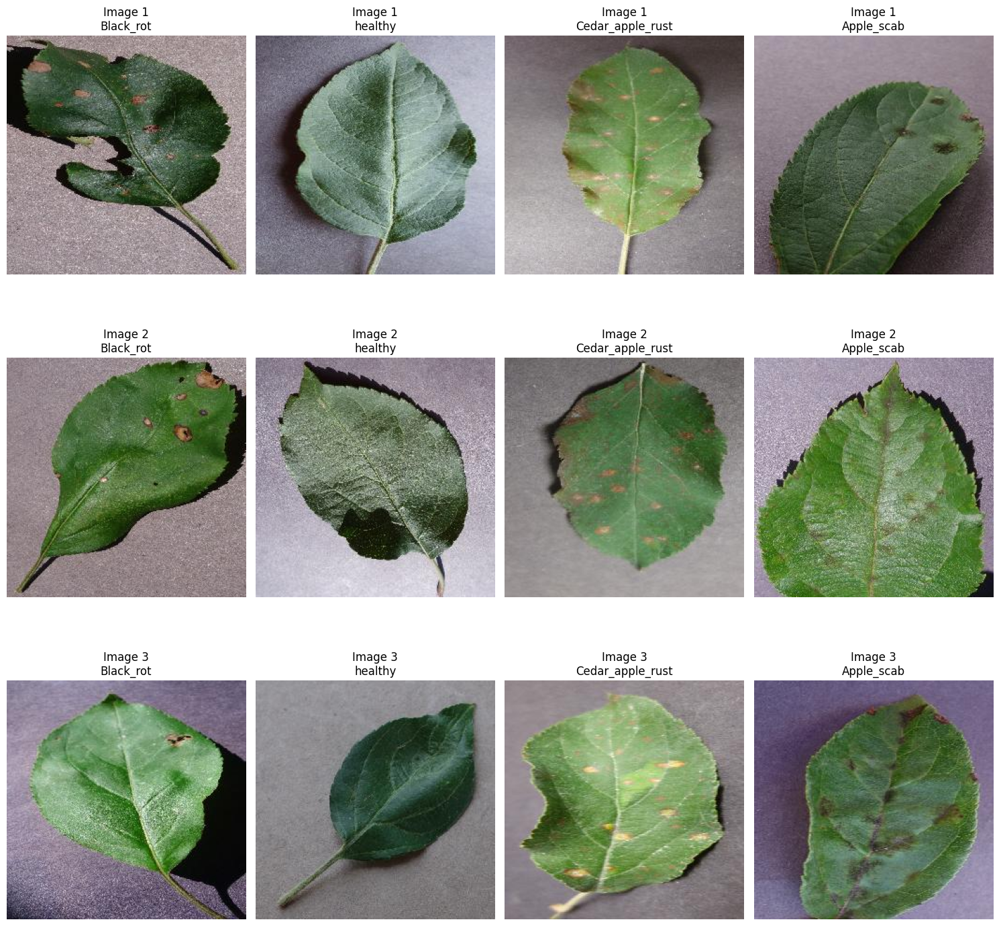

In [ ]:
# Utilisation de la fonction pour afficher les images
display_images(directory_path, num_rows=3)

<h3 style='color:purple'> Explore Images distrubution/Histogrammes</h3>

In [ ]:
def display_histograms(directory_path, num_rows=3):
    class_folders = [f for f in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, f))]
    num_cols = len(class_folders)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

    for col, class_folder in enumerate(class_folders):
        class_path = os.path.join(directory_path, class_folder)
        class_images = [f for f in os.listdir(class_path) if f.endswith('.JPG')][:num_rows]

        for row, image_file in enumerate(class_images):
            img_path = os.path.join(class_path, image_file)
            img = cv2.imread(img_path)

            ax = axes[row, col]
            ax.hist(img.ravel(), bins=256, color='gray', alpha=0.7)
            ax.set_title(f'Hist {row + 1}\n{class_folder}')

    for i in range(len(class_folders), num_rows):
        for j in range(num_cols):
            fig.delaxes(axes[i, j])

    plt.tight_layout()
    plt.show()

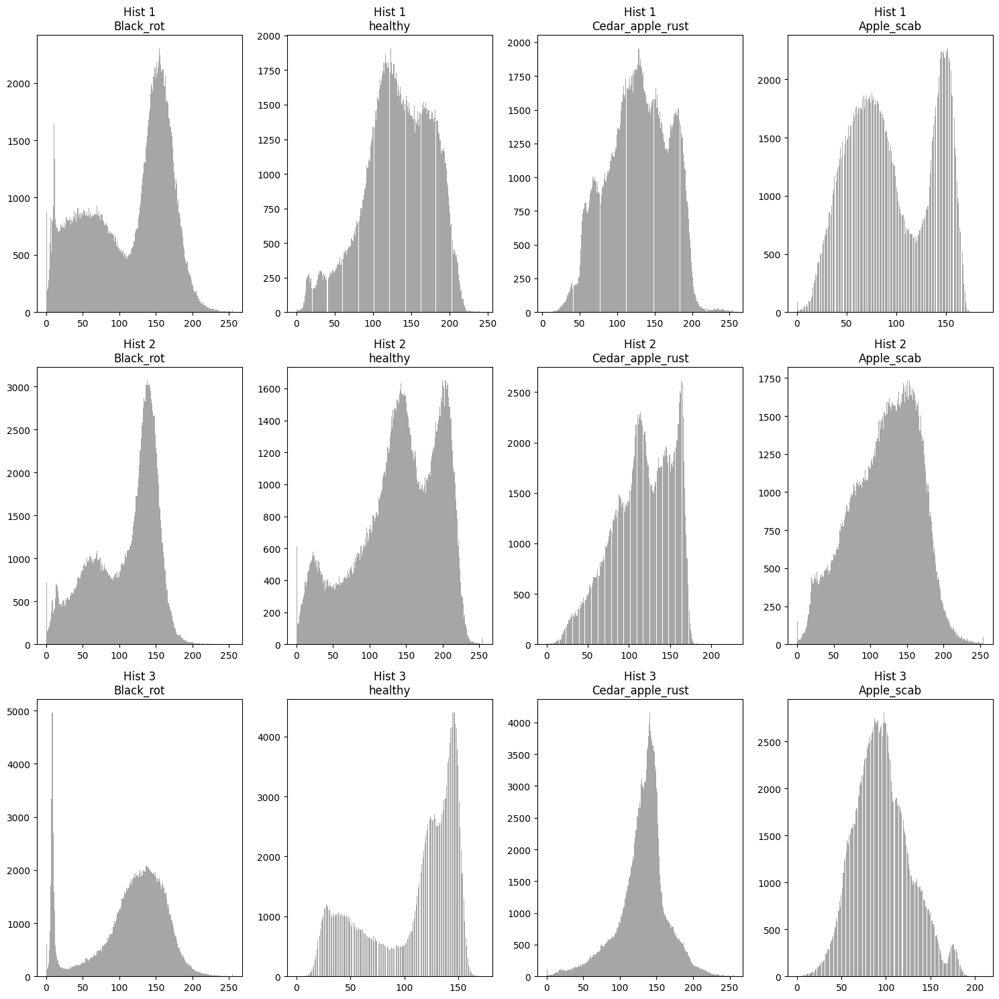

In [ ]:
# Utilisation de la fonction pour afficher les histogrammes
display_histograms(directory_path, num_rows=3)

<h3 style='color:purple'> Show number of images in every class</h3>

In [ ]:
import plotly.express as px

def display_pie_chart(directory_path):
    # Dictionary to store the count of images per class
    class_image_counts = {}

    # Récupérer la liste des dossiers (classes)
    class_folders = [f for f in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, f))]

    for class_folder in class_folders:
        class_path = os.path.join(directory_path, class_folder)
        class_images = [f for f in os.listdir(class_path) if f.endswith('.JPG')]

        # Count the number of images for each class
        num_images = len(class_images)
        class_image_counts[class_folder] = num_images

    # Convertir le dictionnaire en listes séparées pour le pie chart
    labels = list(class_image_counts.keys())
    values = list(class_image_counts.values())

    # Créer le pie chart avec Plotly
    fig_pie = px.pie(names=labels, values=values, title='Number of Images per Class')
    fig_pie.show()

In [ ]:
# Utilisation de la fonction pour afficher le pie chart
display_pie_chart(directory_path)

<h3 style='color:purple'> Show shapes of images</h3>

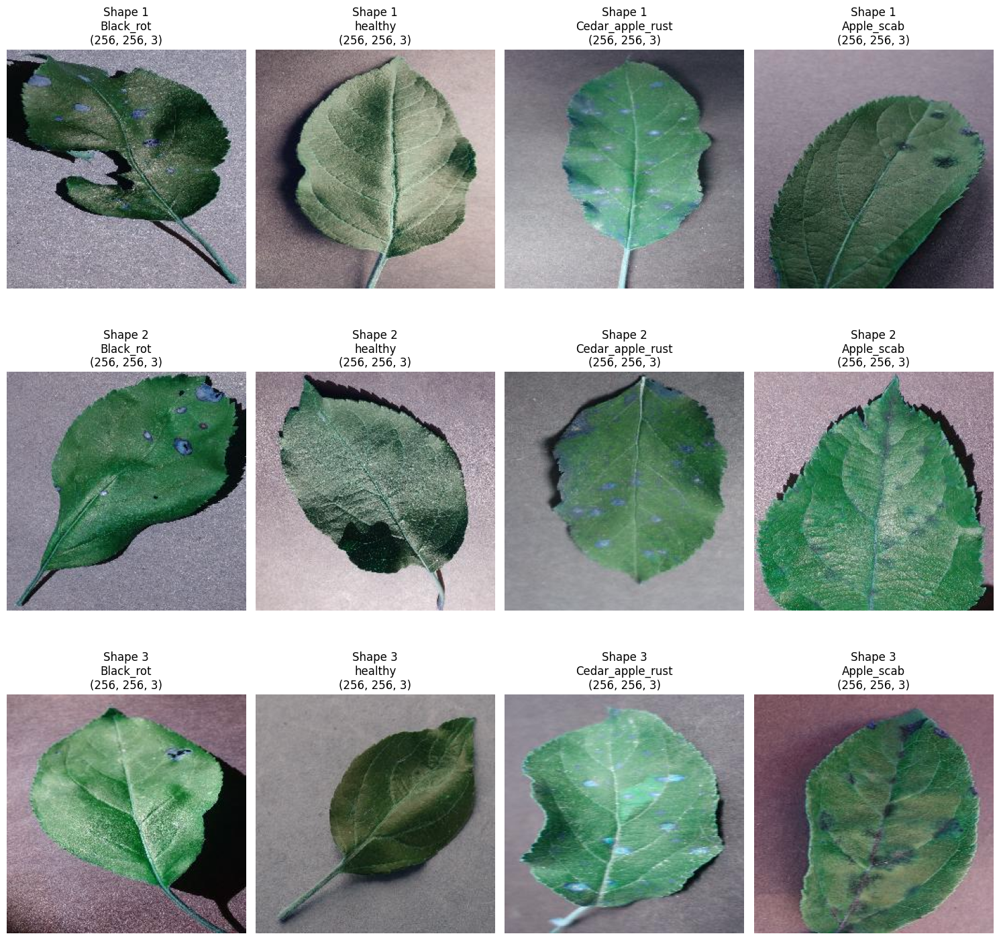

In [ ]:
def display_image_shapes(directory_path, num_rows=3):
    class_folders = [f for f in os.listdir(directory_path) if os.path.isdir(os.path.join(directory_path, f))]
    num_cols = len(class_folders)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

    for col, class_folder in enumerate(class_folders):
        class_path = os.path.join(directory_path, class_folder)
        class_images = [f for f in os.listdir(class_path) if f.endswith('.JPG')][:num_rows]

        for row, image_file in enumerate(class_images):
            img_path = os.path.join(class_path, image_file)
            img = cv2.imread(img_path)

            ax = axes[row, col]
            ax.imshow(img)
            ax.set_title(f'Shape {row + 1}\n{class_folder}\n{img.shape}')
            ax.axis('off')

    for i in range(len(class_folders), num_rows):
        for j in range(num_cols):
            fig.delaxes(axes[i, j])

    plt.tight_layout()
    plt.show()

# Utilisation de la fonction pour afficher les shapes des images
display_image_shapes(directory_path, num_rows=3)


<h3 style='color:purple'> Import data into tensorflow dataset object</h3>

      We will use image_dataset_from_directory api to load all images in tensorflow dataset:       
https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image_dataset_from_directory

In [ ]:
from tensorflow.keras.preprocessing import image_dataset_from_directory


BATCH_SIZE = 32
IMAGE_SIZE = (256, 256)
CHANNELS=3
EPOCHS=5

dataset = image_dataset_from_directory(
    directory_path,
    shuffle=True,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    follow_links=False,
    validation_split=0.2,
    subset="training",
    seed=1337
)

Found 4000 files belonging to 4 classes.
Using 3200 files for training.


In [ ]:
class_names = dataset.class_names
class_names

['Apple_scab', 'Black_rot', 'Cedar_apple_rust', 'healthy']

In [ ]:
class_labels_dict = {}
# Fill the dictionary with classes and their labels
for index, class_name in enumerate(class_names):
    class_labels_dict[class_name] = index

print(class_labels_dict)

{'Apple_scab': 0, 'Black_rot': 1, 'Cedar_apple_rust': 2, 'healthy': 3}


In [ ]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[[0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 1. 0. 0.]]


    As you can see above, each element in the dataset is a tuple. First element is a batch of 32 elements of images. Second element is a batch of 32 elements of class labels

<h3 style='color:purple'> Visualize some of the images from our dataset</h3>

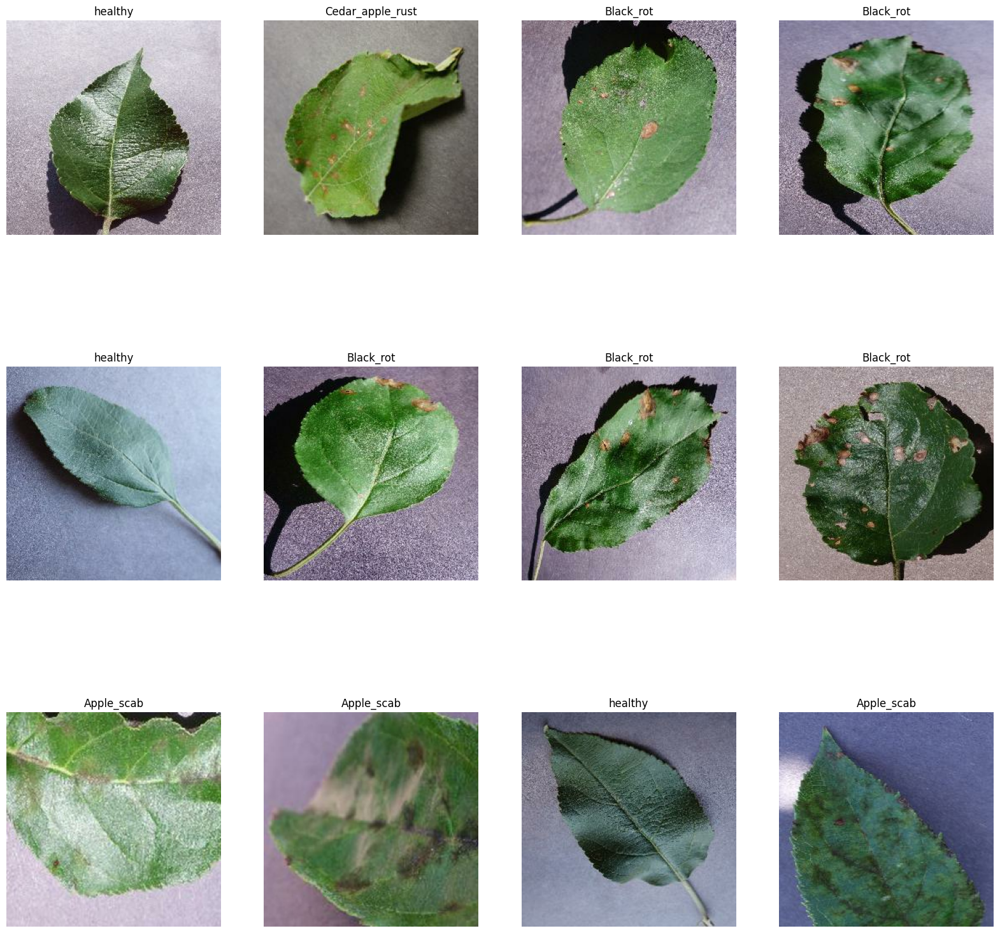

In [ ]:
plt.figure(figsize=(20, 20))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)

        # Use numpy.argmax() to get the index of the maximum value
        label_index = int(tf.argmax(labels_batch[i]).numpy())

        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_index])
        plt.axis("off")

<h3 style='color:purple'> Function to Split Dataset</h3>

    Dataset should be bifurcated into 3 subsets, namely:
    1. Training: Dataset to be used while training
    2. Validation: Dataset to be tested against while training
    3. Test: Dataset to be tested against after we trained a model

In [ ]:
len(dataset)

100

In [ ]:
train_size = 0.8
len(dataset)*train_size

80.0

In [ ]:
train_ds = dataset.take(80)
len(train_ds)

80

In [ ]:
test_ds = dataset.skip(80)
len(test_ds)

20

In [ ]:
val_size=0.1
len(dataset)*val_size

10.0

In [ ]:
val_ds = test_ds.take(10)
len(val_ds)

10

In [ ]:
test_ds = test_ds.skip(10)
len(test_ds)

10

In [ ]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1

    ds_size = len(ds)

    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)

    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)

    train_ds = ds.take(train_size)
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)

    return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset, shuffle=True)

In [ ]:
train_ds = train_ds.map(lambda x, y: (x, tf.argmax(y, axis=-1)))
val_ds = val_ds.map(lambda x, y: (x, tf.argmax(y, axis=-1)))
test_ds = test_ds.map(lambda x, y: (x, tf.argmax(y, axis=-1)))

In [ ]:
len(train_ds)

80

In [ ]:
len(val_ds)

10

In [ ]:
len(test_ds)

10

<h2 style='color:brown'>II-Building the Model</h2>

<h3 style='color:orange'> Creating a Layer for Resizing and Normalization</h3>

    Before we feed our images to network, we should be resizing it to the desired size.
    Moreover, to improve model performance, we should normalize the image pixel value (keeping them in range 0 and 1 by dividing by 256).
    This should happen while training as well as inference. Hence we can add that as a layer in our Sequential Model.

    You might be thinking why do we need to resize (256,256) image to again (256,256). You are right we don't need to but this will be useful when we are done with the training and start using the model for predictions. At that time somone can supply an image that is not (256,256) and this layer will resize it

In [ ]:
resize_and_rescale = tf.keras.Sequential([
  layers.experimental.preprocessing.Resizing(IMAGE_SIZE[0], IMAGE_SIZE[1]),
  layers.experimental.preprocessing.Rescaling(1./255),
])

<h3 style='color:orange'> Data Augmentation</h3>

     Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [ ]:
def adjust_brightness(image, factor):
    return tf.image.adjust_brightness(image, factor)
data_augmentation = tf.keras.Sequential([
  layers.experimental.preprocessing.RandomRotation(0.2),
  layers.experimental.preprocessing.RandomZoom(0.2),
  layers.experimental.preprocessing.RandomContrast(0.2),
  layers.experimental.preprocessing.RandomZoom(-0.2),
  layers.Lambda(lambda x: adjust_brightness(x, 0.2))
])

#### Applying Data Augmentation to Train Dataset

In [ ]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), tf.cast(y, dtype=tf.int32))
).prefetch(buffer_size=tf.data.AUTOTUNE)


<h3 style='color:orange'> Model Architecture</h3>

    We use a CNN coupled with a Softmax activation in the output layer. We also add the initial layers for resizing, normalization and Data Augmentation.

In [ ]:
input_shape = (IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS)

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='tanh'),
    layers.Dense(4, activation='softmax'),
])

# Build the model
model.build(input_shape=(None, IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS))


In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 127, 127, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 60, 60, 64)       

<h3 style='color:orange'> Compiling the Model</h3>

We use `adam` Optimizer, `SparseCategoricalCrossentropy` for losses, `accuracy` as a metric

In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])


In [ ]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=5,
)

Epoch 1/5
80/80 [==============================] - 72s 689ms/step - loss: 1.2526 - accuracy: 0.4059 - val_loss: 0.9389 - val_accuracy: 0.6094
Epoch 2/5
80/80 [==============================] - 58s 686ms/step - loss: 0.8236 - accuracy: 0.6602 - val_loss: 1.0355 - val_accuracy: 0.6094
Epoch 3/5
80/80 [==============================] - 57s 693ms/step - loss: 0.8494 - accuracy: 0.6574 - val_loss: 1.1675 - val_accuracy: 0.5719
Epoch 4/5
80/80 [==============================] - 59s 704ms/step - loss: 0.6843 - accuracy: 0.7203 - val_loss: 0.6573 - val_accuracy: 0.7375


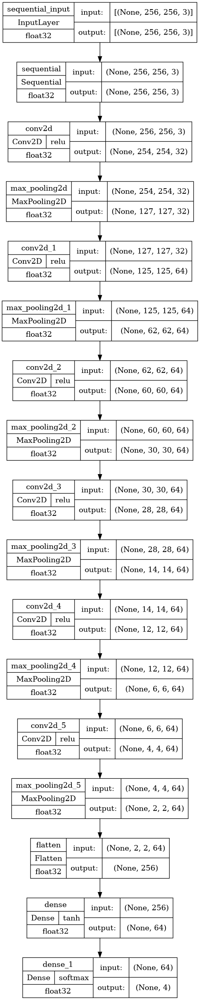

In [ ]:
tf.keras.utils.plot_model(model,show_shapes=True, show_dtype=True, show_layer_activations=True)

In [ ]:
scores = model.evaluate(test_ds)

10/10 [==============================] - 3s 20ms/step - loss: 0.6366 - accuracy: 0.7500


**You can see above that we get 100.00% accuracy for our test dataset. This is considered to be a pretty good accuracy**

In [ ]:
scores

[0.6366119384765625, 0.75]

    Scores is just a list containing loss and accuracy value

<h3 style='color:orange'> Plotting the Accuracy and Loss Curves</h3>

In [ ]:
history

In [ ]:
history.params

{'verbose': 1, 'epochs': 5, 'steps': 80}

In [ ]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

**loss, accuracy, val loss etc are a python list containing values of loss, accuracy etc at the end of each epoch**

In [ ]:
type(history.history['loss'])

list

In [ ]:
len(history.history['loss'])

5

In [ ]:
history.history['loss'][:5] # show loss for first 5 epochs

[1.2526098489761353,
 0.8236360549926758,
 0.8493892550468445,
 0.7270029783248901,
 0.6843054294586182]

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

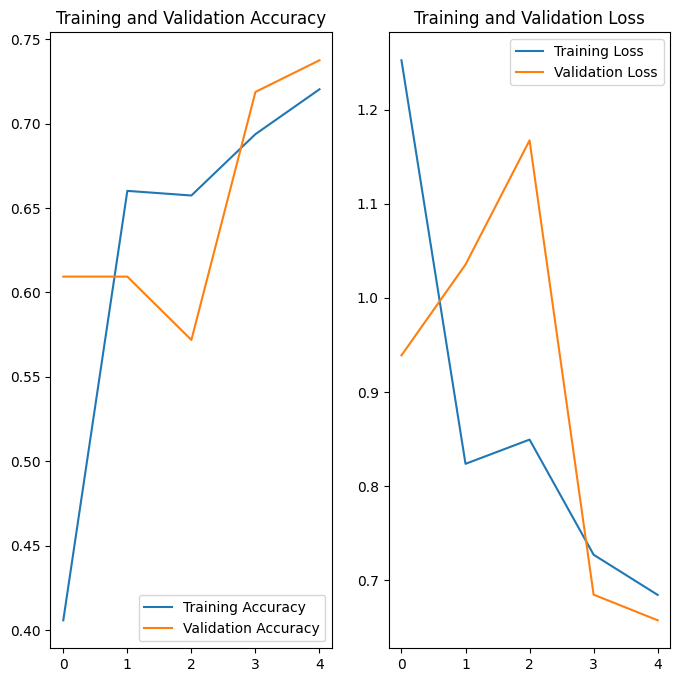

In [ ]:
EPOCHS=5
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

<h3 style='color:orange'> Run prediction on a sample image</h3>

first image to predict
actual label: healthy
1/1 [==============================] - 0s 193ms/step
predicted label: healthy


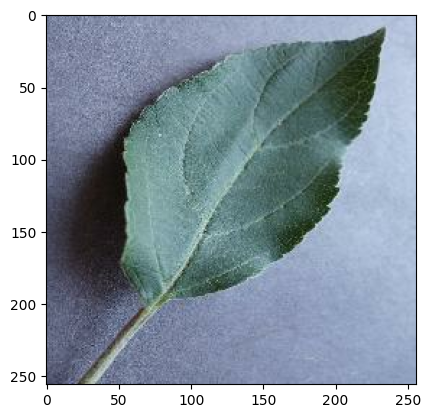

In [ ]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):

    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])

    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

<h3 style='color:orange'> Write a function for inference</h3>

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

**Now run inference on few sample images**

1/1 [==============================] - 0s 25ms/step


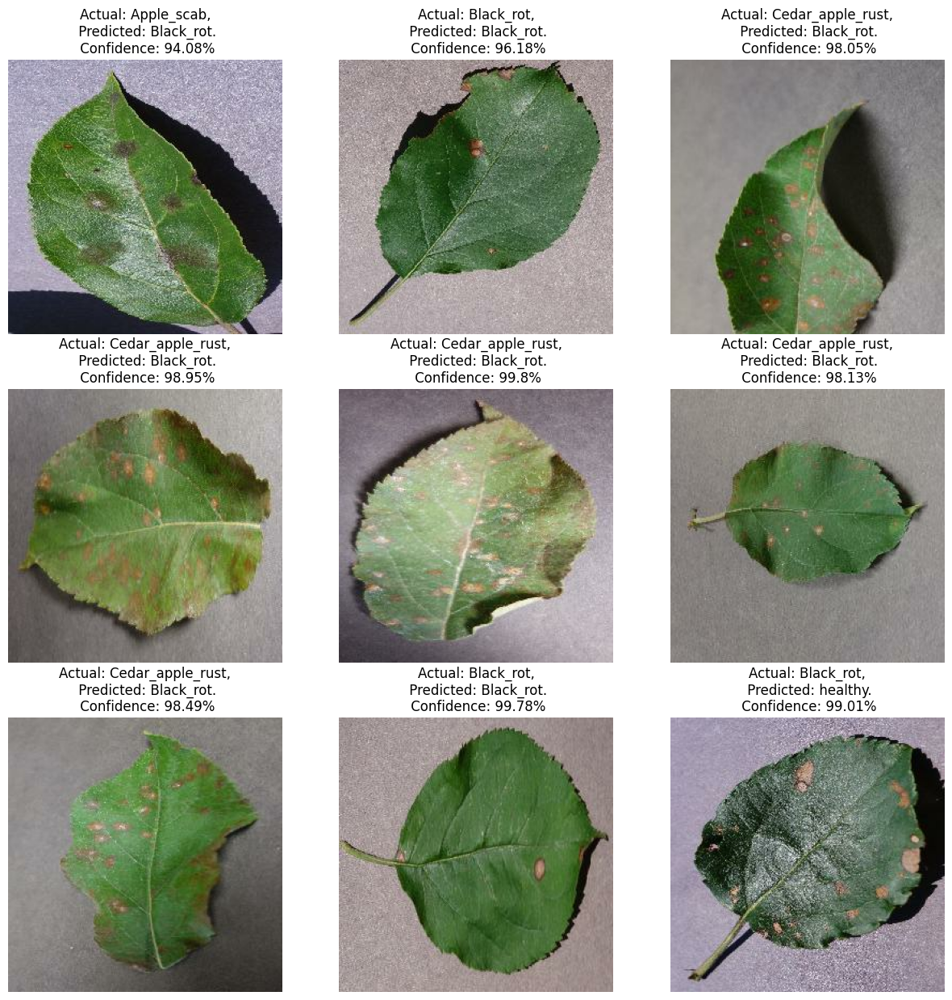

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")

        plt.axis("off")

<h3 style='color:orange'> Confusion Matrix</h3>

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay, classification_report
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred = model.predict(test_ds)

10/10 [==============================] - 2s 17ms/step


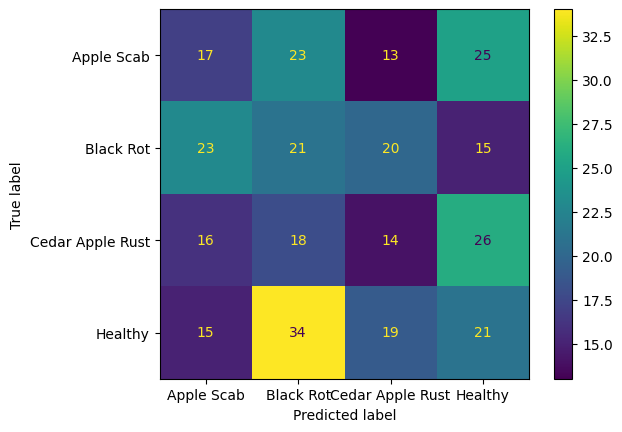

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_true.reshape(-1),np.argmax(y_pred,axis=1), display_labels=['Apple Scab', 'Black Rot', 'Cedar Apple Rust','Healthy'])

In [ ]:
from sklearn.metrics import classification_report
class_report = classification_report(y_true.reshape(-1),np.argmax(y_pred,axis=1), target_names=['Apple Scab', 'Black Rot', 'Cedar Apple Rust','Healthy'])
print("Classification Report:")
print(class_report)

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab       0.24      0.22      0.23        78
       Black Rot       0.22      0.27      0.24        79
Cedar Apple Rust       0.21      0.19      0.20        74
         Healthy       0.24      0.24      0.24        89

        accuracy                           0.23       320
       macro avg       0.23      0.23      0.23       320
    weighted avg       0.23      0.23      0.23       320



<h3 style='color:orange'>Metrics</h3>

In [ ]:
from sklearn.metrics import accuracy_score ,precision_score, recall_score, f1_score, roc_auc_score
# Calcul des métriques
accuracy = accuracy_score(y_true.reshape(-1), np.argmax(y_pred, axis=1))
precision = precision_score(y_true.reshape(-1),np.argmax(y_pred,axis=1), average='weighted')
recall = recall_score(y_true.reshape(-1),np.argmax(y_pred,axis=1), average='weighted')
f1 = f1_score(y_true.reshape(-1),np.argmax(y_pred,axis=1), average='weighted')
auc_roc = roc_auc_score(y_true,y_pred, multi_class='ovr')

# Affichage des métriques
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"AUC-ROC: {auc_roc}")

Accuracy: 0.228125
Precision: 0.2285532332990235
Recall: 0.228125
F1 Score: 0.22749154400549115
AUC-ROC: 0.47010319119997135


<h2 style='color:brown'>III.Visualization of Learned Features and Decision Support in Agriculture.</h2>

  

In [ ]:
pip install tf-keras-vis

  Obtaining dependency information for tf-keras-vis from https://files.pythonhosted.org/packages/d5/7f/115b804ae352989a2cf12ce66fb890f72a391837fa9baa9b218248b088a7/tf_keras_vis-0.8.6-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.1/52.1 kB 2.1 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


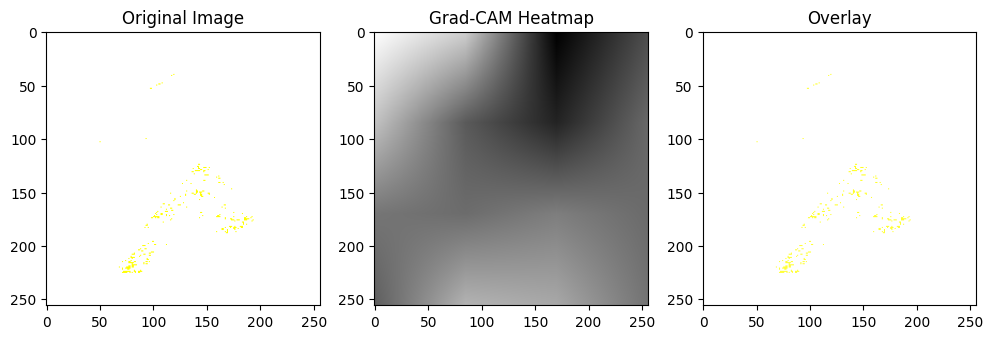

In [ ]:
from tf_keras_vis.gradcam import Gradcam
from tensorflow.keras.models import Model

model = Model(inputs=model.inputs, outputs=model.layers[-1].output)
sample_image, sample_label = next(iter(test_ds))
image_array = sample_image[0].numpy()
image_array = (image_array * 255).astype(np.uint8)

# Utilisation de Grad-CAM
def score_function(output):

    return output[:, np.argmax(output)]

cam = Gradcam(model, model_modifier=None)
cam_result = cam(score=score_function, seed_input=sample_image[0])

# Resize the heatmap to match the dimensions of the original image
heatmap_resized = cv2.resize(cam_result[0], (image_array.shape[1], image_array.shape[0]))

# Ensure both the image and heatmap have the same number of channels
if image_array.shape[-1] == 1:
    heatmap_resized = np.expand_dims(heatmap_resized, axis=-1)
elif image_array.shape[-1] > 1 and len(heatmap_resized.shape) == 2:
    heatmap_resized = np.stack([heatmap_resized] * image_array.shape[-1], axis=-1)

# Ensure both arrays have the same data type
image_array = image_array.astype(heatmap_resized.dtype)

# Superposition de la carte de chaleur sur l'image
img_with_heatmap = cv2.addWeighted(image_array, 0.8, heatmap_resized, 0.4, 0)

# Affichage de l'image originale, de la carte de chaleur et de l'image superposée
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(image_array)
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(heatmap_resized.squeeze(), cmap='viridis')  # Squeeze to remove the channel dimension
plt.title('Grad-CAM Heatmap')

plt.subplot(1, 3, 3)
plt.imshow(img_with_heatmap)
plt.title('Overlay')
plt.show()


<h2 style='color:brown'>IV.Advanced Techniques</h2>

  

In [ ]:
from sklearn.metrics import confusion_matrix
# Évaluation des modèles
def evaluate_model(model, test_ds):

    y_true = np.concatenate([y for x, y in test_ds], axis=0)
    y_pred = model.predict(test_ds)

    # Accuracy
    accuracy = accuracy_score(y_true.reshape(-1), np.argmax(y_pred, axis=1))

    # Precision, Recall, F1 Score
    precision = precision_score(y_true.reshape(-1), np.argmax(y_pred, axis=1), average='weighted')
    recall = recall_score(y_true.reshape(-1), np.argmax(y_pred, axis=1), average='weighted')
    f1 = f1_score(y_true.reshape(-1), np.argmax(y_pred, axis=1), average='weighted')

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_true.reshape(-1), np.argmax(y_pred, axis=1))
    #ConfusionMatrixDisplay(conf_matrix, display_labels=['Apple Scab', 'Black Rot', 'Cedar Apple Rust', 'Healthy']).plot()

    # Classification Report
    class_report = classification_report(y_true.reshape(-1), np.argmax(y_pred, axis=1), target_names=['Apple Scab', 'Black Rot', 'Cedar Apple Rust', 'Healthy'])

    # AUC-ROC Score
    auc_roc = roc_auc_score(y_true, y_pred, multi_class='ovr')

    return accuracy, precision, recall, f1, class_report,auc_roc

* ***ResNet VS CNN from Scratch***

In [ ]:
# Création du modèle ResNet
resnet_model = tf.keras.applications.ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS),
    pooling='avg',
)

model_2 = models.Sequential([
    resize_and_rescale,
    resnet_model,
    layers.Flatten(),
    layers.Dense(64, activation='tanh'),
    layers.Dense(4, activation='softmax'),
])

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
# Build the ResNet model
model_2.build(input_shape=(None, IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS))
model_2.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Entraînement du modèle ResNet
history_resnet = model_2.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=5,
)

Epoch 1/5
80/80 [==============================] - 107s 725ms/step - loss: 0.3509 - accuracy: 0.8848 - val_loss: 2.5722 - val_accuracy: 0.2188
Epoch 2/5
80/80 [==============================] - 59s 702ms/step - loss: 0.1603 - accuracy: 0.9496 - val_loss: 1.6384 - val_accuracy: 0.2500
Epoch 3/5
80/80 [==============================] - 61s 729ms/step - loss: 0.1110 - accuracy: 0.9609 - val_loss: 2.4899 - val_accuracy: 0.2406
Epoch 4/5
80/80 [==============================] - 61s 709ms/step - loss: 0.0585 - accuracy: 0.9805 - val_loss: 2.2872 - val_accuracy: 0.2375
Epoch 5/5
80/80 [==============================] - 59s 716ms/step - loss: 0.0881 - accuracy: 0.9695 - val_loss: 5.8293 - val_accuracy: 0.2344


In [ ]:
# Évaluation du premier modèle
metrics_model_1 = evaluate_model(model, test_ds)
# Évaluation du modèle ResNet
metrics_model_2 = evaluate_model(model_2, test_ds)

10/10 [==============================] - 4s 70ms/step


In [ ]:
# Affichage des résultats
print("Metrics for Model 1:")
print("Accuracy:", metrics_model_1[0])
print("Recall:", metrics_model_1[1])
print("Precision:", metrics_model_1[2])
print("F1 Score:", metrics_model_1[3])
print("Confusion Matrix:\n", metrics_model_1[4])
print("AUC-ROC Score:", metrics_model_1[5])
print("\n")

print("Metrics for Model 2 (ResNet):")
print("Accuracy:", metrics_model_2[0])
print("Recall:", metrics_model_2[1])
print("Precision:", metrics_model_2[2])
print("F1 Score:", metrics_model_2[3])
print("Confusion Matrix:\n", metrics_model_2[4])
print("AUC-ROC Score:", metrics_model_2[5])

Metrics for Model 1:
Accuracy: 0.240625
Recall: 0.2492518226571061
Precision: 0.240625
F1 Score: 0.23969762281702578
Confusion Matrix:
                   precision    recall  f1-score   support

      Apple Scab       0.31      0.21      0.25        82
       Black Rot       0.26      0.29      0.27        87
Cedar Apple Rust       0.21      0.18      0.20        83
         Healthy       0.20      0.29      0.24        68

        accuracy                           0.24       320
       macro avg       0.25      0.24      0.24       320
    weighted avg       0.25      0.24      0.24       320

AUC-ROC Score: 0.4948735650776392


Metrics for Model 2 (ResNet):
Accuracy: 0.2625
Recall: 0.06890625
Precision: 0.2625
F1 Score: 0.10915841584158417
Confusion Matrix:
                   precision    recall  f1-score   support

      Apple Scab       0.00      0.00      0.00        75
       Black Rot       0.00      0.00      0.00        81
Cedar Apple Rust       0.00      0.00      0.00      

* ***Other Models: EfficientNet, VGG16, DensNet , MobileNet***

In [ ]:
pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [ ]:
from efficientnet.tfkeras import EfficientNetB0
from tensorflow.keras.applications import VGG16, DenseNet121 , MobileNet

# Création des modèles
efficientnet_model = EfficientNetB0(
    include_top=False,
    weights='imagenet',
    input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS),
    pooling='avg',
)

vgg16_model = VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS),
    pooling='avg',
)

densenet_model = DenseNet121(
    include_top=False,
    weights='imagenet',
    input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS),
    pooling='avg',
)
mobilenet_model = MobileNet(
    include_top=False,
    weights='imagenet',
    input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS),
    pooling='avg',
)

17225924/17225924 [==============================] - 0s 0us/step


In [ ]:
# Fonction pour créer et entraîner un modèle
def create_and_train_model(base_model, name):
    model = models.Sequential([
        resize_and_rescale,
        base_model,
        layers.Flatten(),
        layers.Dense(64, activation='tanh'),
        layers.Dense(4, activation='softmax'),
    ])

    model.build(input_shape=(None, IMAGE_SIZE[0], IMAGE_SIZE[1], CHANNELS))
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    history = model.fit(
        train_ds,
        batch_size=BATCH_SIZE,
        validation_data=val_ds,
        verbose=1,
        epochs=5,
    )

    metrics = evaluate_model(model, test_ds)
    metrics_dict = {
        'Model': name,
        'Accuracy': metrics[0],
        'Recall': metrics[1],
        'Precision': metrics[2],
        'F1 Score': metrics[3],
        'Confusion Matrix': metrics[4],
        'AUC-ROC Score': metrics[5],
    }

    return metrics_dict

In [ ]:
# Création et entraînement des modèles
models_to_evaluate = [
    ('CNN Basique', model),
    ('ResNet', model_2),
    ('EfficientNet', efficientnet_model),
    ('VGG16', vgg16_model),
    ('DenseNet', densenet_model),
    ('Mobile' , mobilenet_model),
]

results = []

for model_name, base_model in models_to_evaluate:
    print(f"Evaluating {model_name}...")
    metrics_dict = create_and_train_model(base_model, model_name)
    results.append(metrics_dict)

Evaluating CNN Basique...
Epoch 1/5
80/80 [==============================] - 62s 692ms/step - loss: 1.3899 - accuracy: 0.2480 - val_loss: 1.3949 - val_accuracy: 0.1656
Epoch 2/5
80/80 [==============================] - 58s 700ms/step - loss: 1.3875 - accuracy: 0.2477 - val_loss: 1.3865 - val_accuracy: 0.2500
Epoch 3/5
80/80 [==============================] - 58s 696ms/step - loss: 1.3877 - accuracy: 0.2512 - val_loss: 1.3879 - val_accuracy: 0.2500
Epoch 4/5
80/80 [==============================] - 58s 698ms/step - loss: 1.3881 - accuracy: 0.2422 - val_loss: 1.3877 - val_accuracy: 0.2406
Epoch 5/5
10/10 [==============================] - 3s 16ms/step
Evaluating ResNet...
Epoch 1/5
80/80 [==============================] - 104s 715ms/step - loss: 0.9752 - accuracy: 0.6602 - val_loss: 1.8819 - val_accuracy: 0.2406
Epoch 2/5
80/80 [==============================] - 59s 709ms/step - loss: 0.6586 - accuracy: 0.7066 - val_loss: 2.4808 - val_accuracy: 0.2344
Epoch 3/5
80/80 [===================

2023-12-05 22:15:49.593414: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_6/efficientnet-b0/block2b_drop/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


80/80 [==============================] - 109s 744ms/step - loss: 0.1544 - accuracy: 0.9426 - val_loss: 2.3718 - val_accuracy: 0.5688
Epoch 2/5
80/80 [==============================] - 59s 706ms/step - loss: 0.0414 - accuracy: 0.9855 - val_loss: 1.7042 - val_accuracy: 0.7063
Epoch 3/5
80/80 [==============================] - 60s 712ms/step - loss: 0.0532 - accuracy: 0.9840 - val_loss: 1.4180 - val_accuracy: 0.7656
Epoch 4/5
80/80 [==============================] - 59s 712ms/step - loss: 0.0368 - accuracy: 0.9879 - val_loss: 0.0533 - val_accuracy: 0.9812
Epoch 5/5
10/10 [==============================] - 4s 45ms/step
Evaluating VGG16...
Epoch 1/5
80/80 [==============================] - 74s 724ms/step - loss: 1.7237 - accuracy: 0.2578 - val_loss: 1.3982 - val_accuracy: 0.2219
Epoch 2/5
80/80 [==============================] - 60s 720ms/step - loss: 1.3893 - accuracy: 0.2555 - val_loss: 1.3920 - val_accuracy: 0.2719
Epoch 3/5
80/80 [==============================] - 59s 713ms/step - loss:

In [ ]:
# Tableau de Comparation
results_df = pd.DataFrame(results)
results_df = results_df.drop(columns=['Confusion Matrix'])
results_df.head()

,Model,Accuracy,Recall,Precision,F1 Score,AUC-ROC Score
0,CNN Basique,0.290625,0.084463,0.290625,0.130887,0.500000
1,ResNet,0.271875,0.073916,0.271875,0.116232,0.493249
2,EfficientNet,0.250000,0.254279,0.250000,0.249114,0.500726
3,VGG16,0.237500,0.056406,0.237500,0.091162,0.500000
4,DenseNet,0.253125,0.247878,0.253125,0.229865,0.500440


In [ ]:
results_df.describe().style.background_gradient(cmap = 'copper')

,Accuracy,Recall,Precision,F1 Score,AUC-ROC Score
count,6.000000,6.000000,6.000000,6.000000,6.000000
mean,0.257812,0.160147,0.257812,0.176841,0.499073
std,0.019838,0.097473,0.019838,0.071614,0.002869
min,0.237500,0.056406,0.237500,0.091162,0.493249
25%,0.245312,0.076553,0.245312,0.119895,0.500000
50%,0.251563,0.164201,0.251563,0.180376,0.500011
75%,0.267187,0.246893,0.267187,0.240306,0.500335
max,0.290625,0.254279,0.290625,0.249114,0.500726


<h1 style='color:green' align='center'>Fin</h1>

---